## Seaborn Tutorial

Seaborn is a data visualization library built on top of Matplotlib. It is often used because it makes attractive visualizations and works easily with Pandas. While in Matplotlib you often had to write multiple lines of code to create a plot Seaborn makes assumptions on what you want which often translates into getting the same plot with 1 line of code.

You can install it using the Anaconda Environment tab, or by executing the following in your terminal pip install seaborn or conda install seaborn.

Shift + Tab after attribute to see options

### import

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

# Auto reloads notebook when changes are made
%reload_ext autoreload
%autoreload 2

# MI Data

In [2]:
# IWB temp data from online source
weatherbuoy_df = pd.read_csv('https://erddap.marine.ie/erddap/tabledap/IWBNetwork.csvp?station_id%2Ctime%2CAtmosphericPressure%2CWindDirection%2CWindSpeed%2CWaveHeight%2CWavePeriod%2CSeaTemperature%2Csalinity')

# from local source
# weatherbuoy_df = pd.read_csv('data\IWBNetwork_archive.csv')
weatherbuoy_df['time (UTC)'] = pd.to_datetime(weatherbuoy_df['time (UTC)'])
weatherbuoy_df['year'] = weatherbuoy_df['time (UTC)'].dt.year
weatherbuoy_df['month'] = weatherbuoy_df['time (UTC)'].dt.month
weatherbuoy_df['day'] = weatherbuoy_df['time (UTC)'].dt.day
weatherbuoy_df['mean_yr_station'] = weatherbuoy_df.groupby(['year', 'station_id'])[
    "SeaTemperature (degrees_C)"].transform('mean')
weatherbuoy_df['min_yr_station'] = weatherbuoy_df.groupby(['year', 'station_id'])[
    "SeaTemperature (degrees_C)"].transform('min')
weatherbuoy_df['max_yr_station'] = weatherbuoy_df.groupby(['year', 'station_id'])[
    "SeaTemperature (degrees_C)"].transform('max')
# convert number months to the text months for easier display
weatherbuoy_df['months'] = weatherbuoy_df['time (UTC)'].dt.strftime('%b')

weatherbuoy_df.head

<bound method NDFrame.head of        station_id                time (UTC)  AtmosphericPressure (millibars)  \
0              M1 2001-02-06 13:00:00+00:00                          967.600   
1              M1 2001-02-06 14:00:00+00:00                          969.800   
2              M1 2001-02-06 15:00:00+00:00                          972.000   
3              M1 2001-02-06 16:00:00+00:00                          973.600   
4              M1 2001-02-06 18:00:00+00:00                          976.400   
...           ...                       ...                              ...   
769620         M3 2022-04-06 13:00:00+00:00                          995.935   
769621         M5 2022-04-06 14:00:00+00:00                          992.224   
769622         M2 2022-04-06 14:00:00+00:00                          986.963   
769623         M3 2022-04-06 14:00:00+00:00                          995.288   
769624         M4 2022-04-06 14:00:00+00:00                          977.734   

        W

In [3]:
# IGFS Published Data
igfs_df = pd.read_csv('https://erddap.marine.ie/erddap/tabledap/imi_feas_obs_sp.csvp?Year%2CQuarter%2CICES_Area%2CGear_Code%2CScientific_Name%2CCommon_Name%2CAphiaID%2CDemersal_At_Sea_Scheme_Age_Observations%2CDemersal_At_Sea_Scheme_Biological_Observations%2CDemersal_At_Sea_Scheme_Length_Observations%2CPelagic_At_Sea_Scheme_Age_Observations%2CPelagic_At_Sea_Scheme_Biological_Observations%2CPelagic_At_Sea_Scheme_Length_Observations%2CNephrops_At_Sea_Scheme_Age_Observations%2CNephrops_At_Sea_Scheme_Biological_Observations%2CNephrops_At_Sea_Scheme_Length_Observations%2CPort_Sampling_Scheme_Age_Observations%2CPort_Sampling_Scheme_Biological_Observations%2CPort_Sampling_Scheme_Length_Observations')
igfs_df.head

<bound method NDFrame.head of        Year  Quarter ICES_Area Gear_Code           Scientific_Name  \
0      1960        1    27.7.g   Unknown           Clupea harengus   
1      1960        4    27.7.a       PTM           Clupea harengus   
2      1960        4    27.7.a   Unknown           Clupea harengus   
3      1961        4    27.7.a   Unknown           Clupea harengus   
4      1961        4    27.7.b   Unknown           Clupea harengus   
...     ...      ...       ...       ...                       ...   
35278  2019        3    27.7.j       TWR  Melanogrammus aeglefinus   
35279  2019        3    27.7.j       TWR     Pleuronectes platessa   
35280  2019        3    27.7.j       TWR               Solea solea   
35281  2019        3    27.7.j       TWR         Lophius budegassa   
35282  2019        3    27.7.j       TWR      Merlangius merlangus   

               Common_Name   AphiaID  Demersal_At_Sea_Scheme_Age_Observations  \
0         Atlantic Herring  126417.0            

In [4]:
# Tide Prediction Data
# Howth
tide_pred_df = pd.read_csv('https://erddap.marine.ie/erddap/tabledap/IMI-TidePrediction.csvp?time%2Clongitude%2Clatitude%2CstationID%2CWater_Level%2CWater_Level_ODM&time%3E=2022-01-01&time%3C=2025-01-01T00%3A20%3A00Z&stationID=%22Howth%22')

tide_pred_df['time (UTC)'] = pd.to_datetime(tide_pred_df['time (UTC)'])
tide_pred_df['year'] = tide_pred_df['time (UTC)'].dt.year
tide_pred_df['month'] = tide_pred_df['time (UTC)'].dt.month
tide_pred_df['day'] = tide_pred_df['time (UTC)'].dt.day
tide_pred_df['mean_yr_station'] = tide_pred_df.groupby(['year', 'stationID'])[
    "Water_Level (metres)"].transform('mean')
tide_pred_df['min_yr_station'] = tide_pred_df.groupby(['year', 'stationID'])[
    "Water_Level (metres)"].transform('min')
tide_pred_df['max_yr_station'] = tide_pred_df.groupby(['year', 'stationID'])[
    "Water_Level (metres)"].transform('max')
# convert number months to the text months for easier display
tide_pred_df['months'] = tide_pred_df['time (UTC)'].dt.strftime('%b')
tide_pred_df

,time (UTC),longitude (degrees_east),latitude (degrees_north),stationID,Water_Level (metres),Water_Level_ODM (metres),year,month,day,mean_yr_station,min_yr_station,max_yr_station,months
0,2022-01-01 00:00:00+00:00,-6.0683,53.39148,Howth,2.95,0.27,2022,1,1,2.588278,0.26,4.78,Jan
1,2022-01-01 00:05:00+00:00,-6.0683,53.39148,Howth,2.87,0.19,2022,1,1,2.588278,0.26,4.78,Jan
2,2022-01-01 00:10:00+00:00,-6.0683,53.39148,Howth,2.80,0.12,2022,1,1,2.588278,0.26,4.78,Jan
3,2022-01-01 00:15:00+00:00,-6.0683,53.39148,Howth,2.72,0.04,2022,1,1,2.588278,0.26,4.78,Jan
4,2022-01-01 00:20:00+00:00,-6.0683,53.39148,Howth,2.65,-0.03,2022,1,1,2.588278,0.26,4.78,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...
315644,2024-12-31 23:40:00+00:00,-6.0683,53.39148,Howth,4.01,1.33,2024,12,31,2.589858,0.04,4.86,Dec
315645,2024-12-31 23:45:00+00:00,-6.0683,53.39148,Howth,4.03,1.35,2024,12,31,2.589858,0.04,4.86,Dec
315646,2024-12-31 23:50:00+00:00,-6.0683,53.39148,Howth,4.04,1.36,2024,12,31,2.589858,0.04,4.86,Dec
315647,2024-12-31 23:55:00+00:00,-6.0683,53.39148,Howth,4.05,1.37,2024,12,31,2.589858,0.04,4.86,Dec


In [5]:
# Wave Buoy Data
# AMETS Berth A 2021/2
wave_df = pd.read_csv('https://erddap.marine.ie/erddap/tabledap/IWaveBNetwork.csvp?time%2Cstation_id%2Cinstrument%2CPeakPeriod%2CPeakDirection%2CUpcrossPeriod%2CSignificantWaveHeight%2CSeaTemperature%2CHmax%2CTHmax%2CMeanCurDirTo%2CMeanCurSpeed&time%3E=2021-04-01&time%3C=2022-03-31&station_id=%22AMETS%20Berth%20A%20Wave%20Buoy%22')

wave_df['time (UTC)'] = pd.to_datetime(wave_df['time (UTC)'])
wave_df['year'] = wave_df['time (UTC)'].dt.year
wave_df['month'] = wave_df['time (UTC)'].dt.month
wave_df['day'] = wave_df['time (UTC)'].dt.day

# convert number months to the text months for easier display
wave_df['months'] = wave_df['time (UTC)'].dt.strftime('%b')
wave_df

,time (UTC),station_id,instrument,PeakPeriod (s),PeakDirection (degrees_true),UpcrossPeriod (s),SignificantWaveHeight (cm),SeaTemperature (degree_C),Hmax (cm),THmax (s),MeanCurDirTo (degrees_true),MeanCurSpeed (m/s),year,month,day,months
0,2021-04-01 00:00:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,10.00,6.3,7.833,313.3,NaN,491.0,10.01,NaN,NaN,2021,4,1,Apr
1,2021-04-01 00:03:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,10.00,5.6,7.817,317.6,NaN,NaN,NaN,NaN,NaN,2021,4,1,Apr
2,2021-04-01 00:07:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,10.00,12.8,7.838,322.7,NaN,NaN,NaN,NaN,NaN,2021,4,1,Apr
3,2021-04-01 00:10:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,10.00,12.3,7.848,321.7,NaN,NaN,NaN,NaN,NaN,2021,4,1,Apr
4,2021-04-01 00:13:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,11.11,8.6,7.776,319.3,NaN,NaN,NaN,NaN,NaN,2021,4,1,Apr
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146517,2022-03-30 23:47:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,8.33,10.3,6.198,278.8,NaN,NaN,NaN,NaN,NaN,2022,3,30,Mar
146518,2022-03-30 23:50:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,8.33,12.4,6.199,276.8,NaN,NaN,NaN,NaN,NaN,2022,3,30,Mar
146519,2022-03-30 23:53:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,8.00,11.0,6.299,288.0,NaN,NaN,NaN,NaN,NaN,2022,3,30,Mar
146520,2022-03-30 23:57:00+00:00,AMETS Berth A Wave Buoy,Datawell WaveRider MkIII,8.00,10.1,6.301,288.9,NaN,NaN,NaN,NaN,NaN,2022,3,30,Mar


In [6]:
# simplified data - one station
# m2 = Irish Sea
m2_df = weatherbuoy_df[(weatherbuoy_df.station_id == 'M2')]
# m5 = Celtic Sea
m5_df = weatherbuoy_df[(weatherbuoy_df.station_id == 'M5')]
# m6 = Mid Atlantic
m6_df = weatherbuoy_df[(weatherbuoy_df.station_id == 'M6')]

### Import Data

In [9]:
# You can import custom data
elevation_df = pd.read_csv('./data/Elevation Profile Data.csv')

FileNotFoundError: [Errno 2] No such file or directory: '../data/Elevation Profile Data.csv'

## Barplot of Continental Shelf

In [8]:
plt.figure(figsize=(14,9))
sns.set(rc={'axes.facecolor':'black', 'figure.facecolor':'white', "grid.color": "black"})
shelf_plot = sns.barplot(x='Distance', y='Elevation', data=elevation_df, linewidth=0, dodge=False)
# sns.histplot(x='Distance', y='Elevation', data=elevation_df, linewidth=0)#, dodge=False)
shelf_plot.set_title("Ireland's Continental Shelf Depth Profile", fontsize=20)
shelf_plot.set(xticklabels=[])
shelf_plot.set(xlabel=None)
shelf_plot.set_ylabel("Depth (m)", fontsize=14)
shelf_plot.set_yticklabels(labels=[-5000, -4000, -3000, -2000, -1000, 0], fontsize=14)
plt.savefig('continental_shelf_depth_profile.jpg')

NameError: name 'elevation_df' is not defined

<Figure size 1008x648 with 0 Axes>

## Rose Plot

In [11]:
import plotly.express as px
df = px.data.wind()

bins_dir = [0, 11.25, 33.75, 56.25, 78.75,101.25,123.75,146.25,168.75,191.25,213.75,236.25,258.75,281.25,303.75,326.25,348.75, 360.00]
bins_dir_labels = ['N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW','North']

m5_df['Wind Speed Category (knots)'] = pd.cut(m5_df['WindSpeed (knots)'], bins=[0, 4, 8, 12, 16, 20, 24, 1000], include_lowest=True, 
                                    labels=['4-8', '8-12', '12-16', '16-20', '20-24', '24-28', '28+'])
m5_df['dir_binned'] = pd.cut(m5_df['WindDirection (degrees true)'],bins_dir, labels=bins_dir_labels)

dfe = m5_df[['Wind Speed Category (knots)', 'dir_binned']].copy() #here i am creating a new dataframe, with necessary columns only (except the last one, which I will convert to frequencies column

g = dfe.groupby(['Wind Speed Category (knots)','dir_binned']).size()\
        .reset_index(name="frequency") #grouping
g.reset_index(inplace=True) 
g['percentage'] = g['frequency']/g['frequency'].sum()
g['percentage%'] = g['percentage']*100
g = g.replace(r'North', 'N', regex=True)

fig = px.bar_polar(g, r="percentage%", theta="dir_binned",
                   color="Wind Speed Category (knots)", template="plotly_dark",
                   color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

<ipython-input-11-2d9cfc0bf9b5>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m5_df['Wind Speed Category (knots)'] = pd.cut(m5_df['WindSpeed (knots)'], bins=[0, 4, 8, 12, 16, 20, 24, 1000], include_lowest=True,
<ipython-input-11-2d9cfc0bf9b5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m5_df['dir_binned'] = pd.cut(m5_df['WindDirection (degrees true)'],bins_dir, labels=bins_dir_labels)


In [12]:
##### import plotly.express as px
df = px.data.wind()

bins_dir = [0, 11.25, 33.75, 56.25, 78.75,101.25,123.75,146.25,168.75,191.25,213.75,236.25,258.75,281.25,303.75,326.25,348.75, 360.00]
bins_dir_labels = ['N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW','North']

m2_df['Wind Speed Category (knots)'] = pd.cut(m2_df['WindSpeed (knots)'], bins=[0, 4, 8, 12, 16, 20, 24, 1000], include_lowest=True, 
                                    labels=['4-8', '8-12', '12-16', '16-20', '20-24', '24-28', '28+'])
m2_df['dir_binned'] = pd.cut(m2_df['WindDirection (degrees true)'],bins_dir, labels=bins_dir_labels)

dfe = m2_df[['Wind Speed Category (knots)', 'dir_binned']].copy() #here i am creating a new dataframe, with necessary columns only (except the last one, which I will convert to frequencies column

g = dfe.groupby(['Wind Speed Category (knots)','dir_binned']).size()\
        .reset_index(name="frequency") #grouping
g.reset_index(inplace=True) 
g['percentage'] = g['frequency']/g['frequency'].sum()
g['percentage%'] = g['percentage']*100
g = g.replace(r'North', 'N', regex=True)

fig = px.bar_polar(g, r="percentage%", theta="dir_binned",
                   color="Wind Speed Category (knots)", template="plotly_dark",
                   color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

<ipython-input-12-8f6007146960>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-12-8f6007146960>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
##### import plotly.express as px
df = px.data.wind()

bins_dir = [0, 11.25, 33.75, 56.25, 78.75,101.25,123.75,146.25,168.75,191.25,213.75,236.25,258.75,281.25,303.75,326.25,348.75, 360.00]
bins_dir_labels = ['N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW','North']

m6_df['Wind Speed Category (knots)'] = pd.cut(m6_df['WindSpeed (knots)'], bins=[0, 4, 8, 12, 16, 20, 24, 1000], include_lowest=True, 
                                    labels=['4-8', '8-12', '12-16', '16-20', '20-24', '24-28', '36+'])
m6_df['dir_binned'] = pd.cut(m6_df['WindDirection (degrees true)'],bins_dir, labels=bins_dir_labels)

dfe = m6_df[['Wind Speed Category (knots)', 'dir_binned']].copy() #here i am creating a new dataframe, with necessary columns only (except the last one, which I will convert to frequencies column

g = dfe.groupby(['Wind Speed Category (knots)','dir_binned']).size()\
        .reset_index(name="frequency") #grouping
g.reset_index(inplace=True) 
g['percentage'] = g['frequency']/g['frequency'].sum()
g['percentage%'] = g['percentage']*100
g = g.replace(r'North', 'N', regex=True)

fig = px.bar_polar(g, r="percentage%", theta="dir_binned",
                   color="Wind Speed Category (knots)", template="plotly_dark",
                   color_discrete_sequence= px.colors.sequential.Plasma_r)
fig.show()

<ipython-input-13-6badbabef38c>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-13-6badbabef38c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Distribution Plots

### Distribution Plot

C:\tools\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='SignificantWaveHeight (cm)', ylabel='Density'>

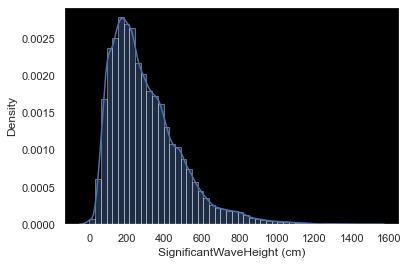

In [14]:
sns.distplot(wave_df['SignificantWaveHeight (cm)'])

In [15]:
# Provides a way to look at a univariate distribution. A 
# univeriate distribution provides a distribution for one variable
# Kernal Density Estimation with a Histogram is provided
# kde=False removes the KDE
# Bins define how many buckets to divide the data up into between intervals
# For example put all profits between $10 and $20 in this bucket
sns.distplot(crash_df['not_distracted'], kde=False, bins=25)

NameError: name 'crash_df' is not defined

### Joint Plot

In [ ]:
# Jointplot compares 2 distributions and plots a scatter plot by default
# As we can see as people tend to speed they also tend to drink & drive
# With kind you can create a regression line with kind='reg'
# You can create a 2D KDE with kind='kde'
# Kernal Density Estimation estimates the distribution of data
# You can create a hexagon distribution with kind='hex'
sns.jointplot(x='speeding', y='alcohol', data=crash_df, kind='reg')

In [ ]:
sns.jointplot(x='WindDirection (degrees true)', y='WindSpeed (knots)', data=m2_df, kind='hex')

### KDE Plot

In [16]:
# Get just the KDE plot
sns.kdeplot(tide_pred_df['alcohol'])

KeyError: 'alcohol'

<AxesSubplot:xlabel='Water_Level (metres)', ylabel='Density'>

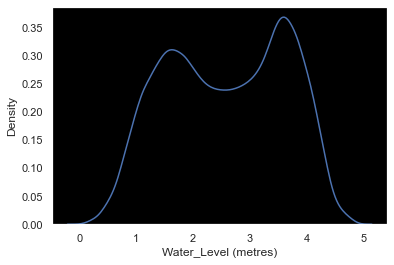

In [17]:
sns.kdeplot(tide_pred_df['Water_Level (metres)'])

### Pair Plots

In [18]:
# Pair Plot plots relationships across the entire data frames numerical values
sns.pairplot(crash_df)

# Load data on tips
tips_df = sns.load_dataset('tips')

# With hue you can pass in a categorical column and the charts will be colorized
# You can use color maps from Matplotlib to define what colors to use
# sns.pairplot(tips_df, hue='sex', palette='Blues')

NameError: name 'crash_df' is not defined

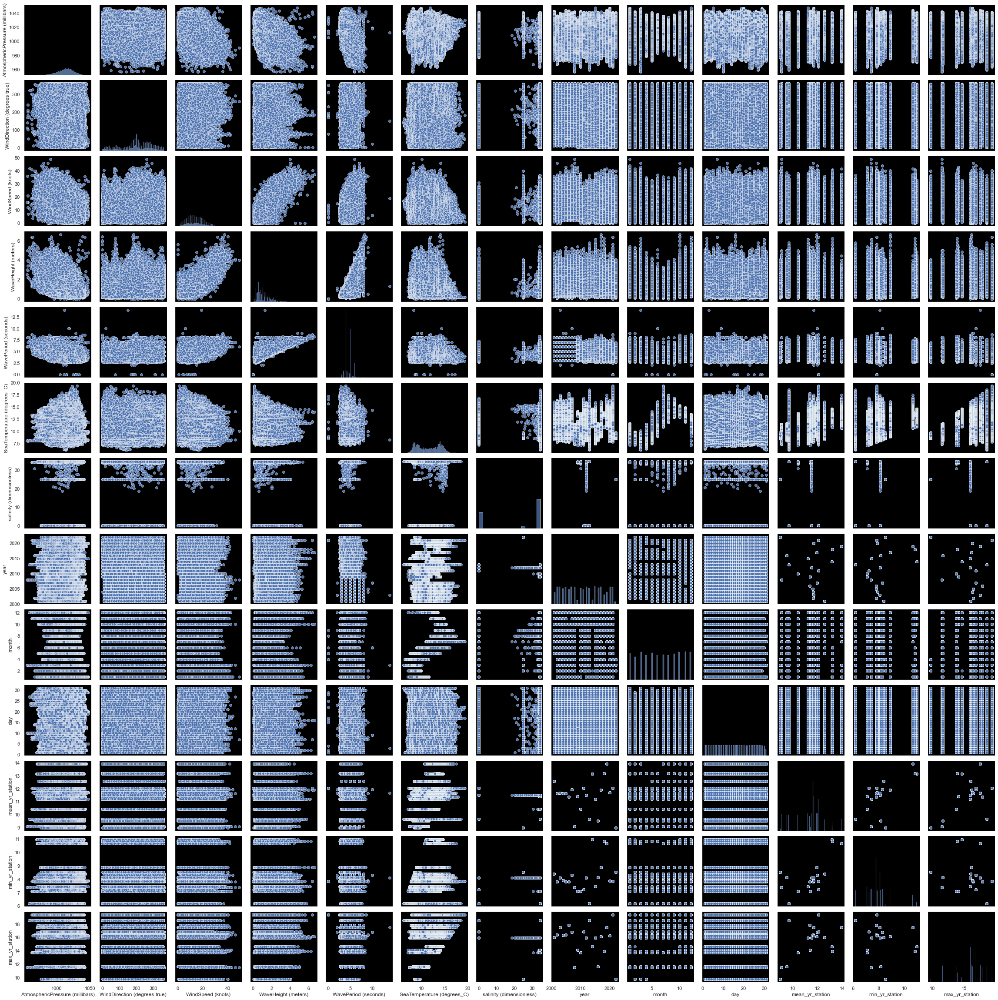

In [19]:
sns.pairplot(m2_df)

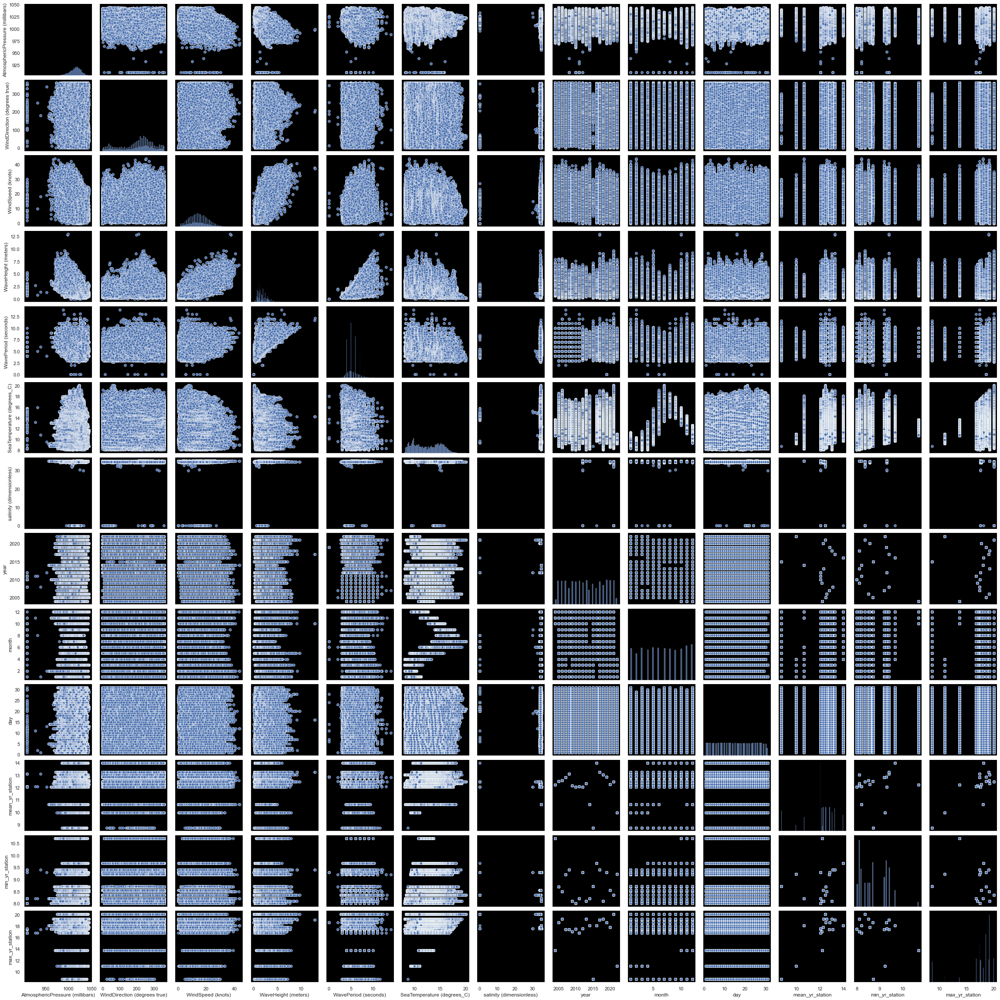

In [20]:
sns.pairplot(m5_df, palette='plasma')

### Rug Plots

In [21]:
# Plots a single column of datapoints in an array as sticks on an axis
# With a rug plot you'll see a more dense number of lines where the amount is 
# most common. This is like how a histogram is taller where values are more common
sns.rugplot(tips_df['tip'])

NameError: name 'tips_df' is not defined

<AxesSubplot:xlabel='SignificantWaveHeight (cm)'>

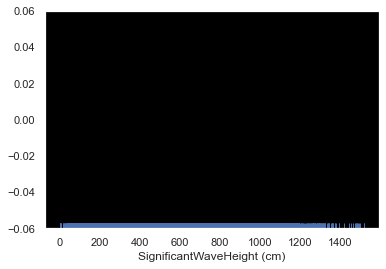

In [22]:
sns.rugplot(wave_df['SignificantWaveHeight (cm)'])

### Styling

<Figure size 1152x720 with 0 Axes>

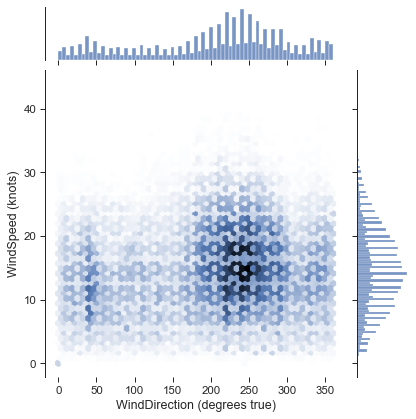

In [23]:
# You can set styling for your axes and grids
# white, darkgrid, whitegrid, dark, ticks
sns.set_style('ticks')

# You can use figure sizing from Matplotlib
plt.figure(figsize=(16,10))

# Change size of lables, lines and other elements to best fit
# how you will present your data (paper, talk, poster)
sns.set_context('paper', font_scale=1.3)

sns.jointplot(x='WindDirection (degrees true)', y='WindSpeed (knots)', data=m5_df, kind='hex', palette='Reds')

# Get rid of spines
# You can turn of specific spines with right=True, left=True
# bottom=True, top=True
sns.despine(left=False, bottom=True)

### Categorical Plots

### Bar Plots

<AxesSubplot:xlabel='year', ylabel='WindSpeed (knots)'>

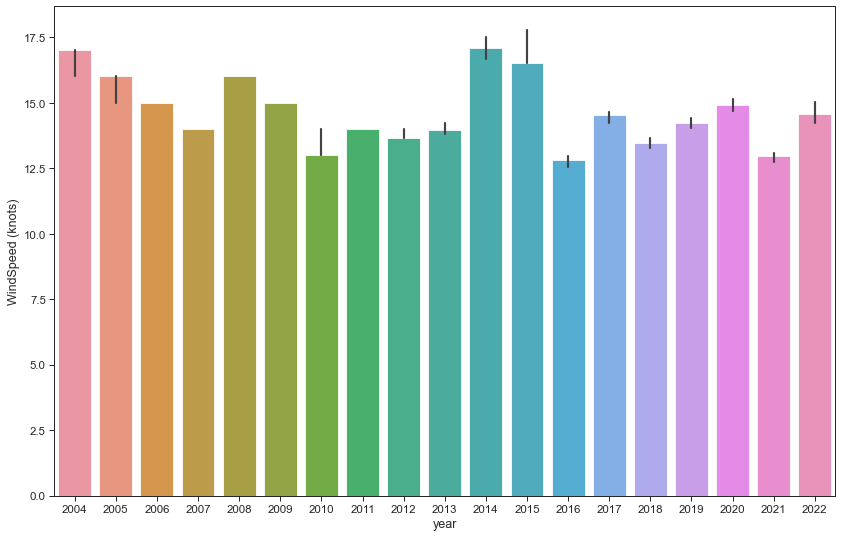

In [24]:
# Focus on distributions using categorical data in reference to one of the numerical
# columns

# Aggregate categorical data based on a function (mean is the default)
# Estimate total bill amount based on sex
# With estimator you can define functions to use other than the mean like those
# provided by NumPy : median, std, var, cov or make your own functions
plt.figure(figsize=(14,9))

sns.barplot(x='year',y='WindSpeed (knots)',data=m5_df, estimator=np.median)

### Count Plot

<AxesSubplot:xlabel='count', ylabel='mean_yr_station'>

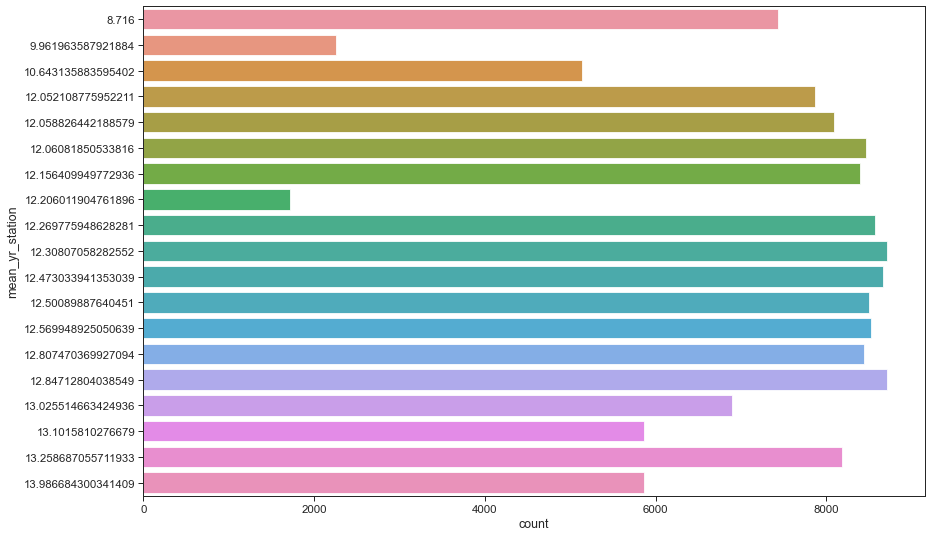

In [25]:
# A count plot is like a bar plot, but the estimator is counting 
# the number of occurances
plt.figure(figsize=(14,9))

sns.countplot(y='mean_yr_station', data=m5_df)

### Box Plot

In [26]:
plt.figure(figsize=(14,9))
sns.set_style('darkgrid')

# A box plot allows you to compare different variables
# The box shows the quartiles of the data. The bar in the middle is the median and
# the box extends 1 standard deviation from the median
# The whiskers extend to all the other data aside from the points that are considered
# to be outliers
# Hue can add another category being sex
# We see men spend way more on Friday versus less than women on Saturday
sns.boxplot(x='day',y='total_bill',data=tips_df, hue='sex')

# Moves legend to the best position
plt.legend(loc=0)

NameError: name 'tips_df' is not defined

<Figure size 1008x648 with 0 Axes>

### Violin Plot

In [27]:
# Violin Plot is a combination of the boxplot and KDE
# While a box plot corresponds to data points, the violin plot uses the KDE estimation
# of the data points
# Split allows you to compare how the categories compare to each other
sns.violinplot(x='day',y='total_bill',data=tips_df, hue='sex',split=True)

NameError: name 'tips_df' is not defined

### Strip Plot

In [28]:
plt.figure(figsize=(8,5))

# The strip plot draws a scatter plot representing all data points where one
# variable is categorical. It is often used to show all observations with 
# a box plot that represents the average distribution
# Jitter spreads data points out so that they aren't stacked on top of each other
# Hue breaks data into men and women
# Dodge separates the men and women data
sns.stripplot(x='day',y='total_bill',data=tips_df, jitter=True, 
              hue='sex', dodge=True)

NameError: name 'tips_df' is not defined

<Figure size 576x360 with 0 Axes>

### Swarm Plot

In [29]:
# A swarm plot is like a strip plot, but points are adjusted so they don't overlap
# It looks like a combination of the violin and strip plots
# sns.swarmplot(x='day',y='total_bill',data=tips_df)

# You can stack a violin plot with a swarm
sns.violinplot(x='day',y='total_bill',data=tips_df)
sns.swarmplot(x='day',y='total_bill',data=tips_df, color='white')


NameError: name 'tips_df' is not defined

### Palettes

In [30]:
plt.figure(figsize=(8,6))

sns.set_style('dark')

sns.set_context('talk')

# You can use Matplotlibs color maps for color styling
# https://matplotlib.org/3.3.1/tutorials/colors/colormaps.html
sns.stripplot(x='day',y='total_bill',data=tips_df, hue='sex', 
             palette='seismic')

# Add the optional legend with a location number (best: 0, 
# upper right: 1, upper left: 2, lower left: 3, lower right: 4,
# https://matplotlib.org/3.3.1/api/_as_gen/matplotlib.pyplot.legend.html)
# or supply a tuple of x & y from lower left
plt.legend(loc=0)

NameError: name 'tips_df' is not defined

<Figure size 576x432 with 0 Axes>

### Matrix Plots

### Heatmaps

In [31]:
plt.figure(figsize=(8,6))
sns.set_context('paper', font_scale=1.4)
# To create a heatmap with data you must have data set up as a matrix where variables
# are on the columns and rows

# Correlation tells you how influential a variable is on the result
# So we see that n previous accident is heavily correlated with accidents, while the
# insurance premium is not
crash_mx = crash_df.corr()

# Create the heatmap, add annotations and a color map
sns.heatmap(crash_mx, annot=True, cmap='Blues')

NameError: name 'crash_df' is not defined

<Figure size 576x432 with 0 Axes>

<AxesSubplot:>

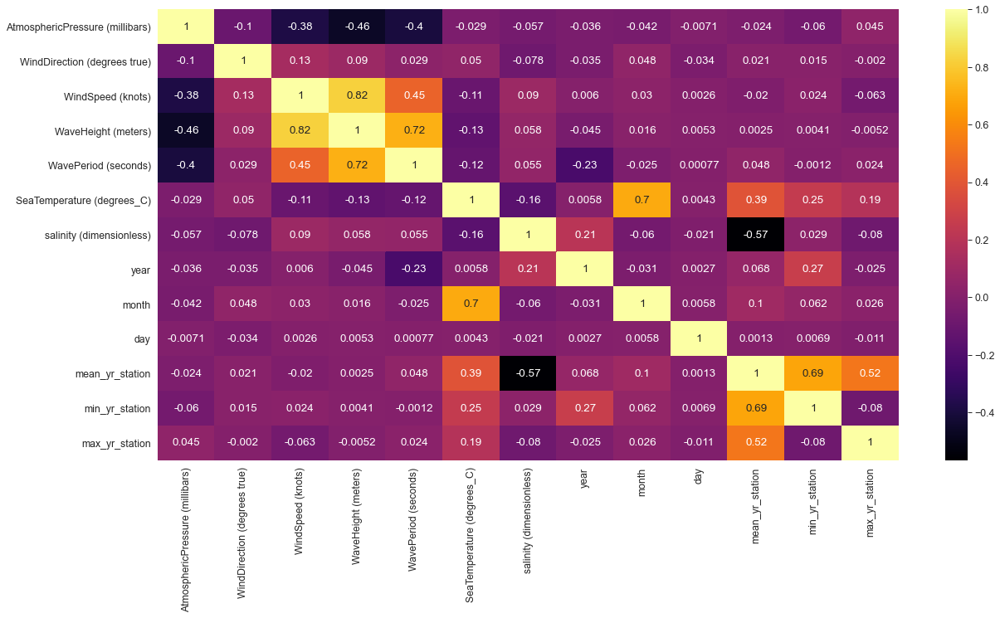

In [32]:
# Correlation of Weather Buoy variables
plt.figure(figsize=(20,10))
sns.set_context('paper', font_scale=1.4)
# To create a heatmap with data you must have data set up as a matrix where variables
# are on the columns and rows

m2_mx = m2_df.corr()

# Create the heatmap, add annotations and a color map
sns.heatmap(m2_mx, annot=True, cmap='inferno')

<AxesSubplot:>

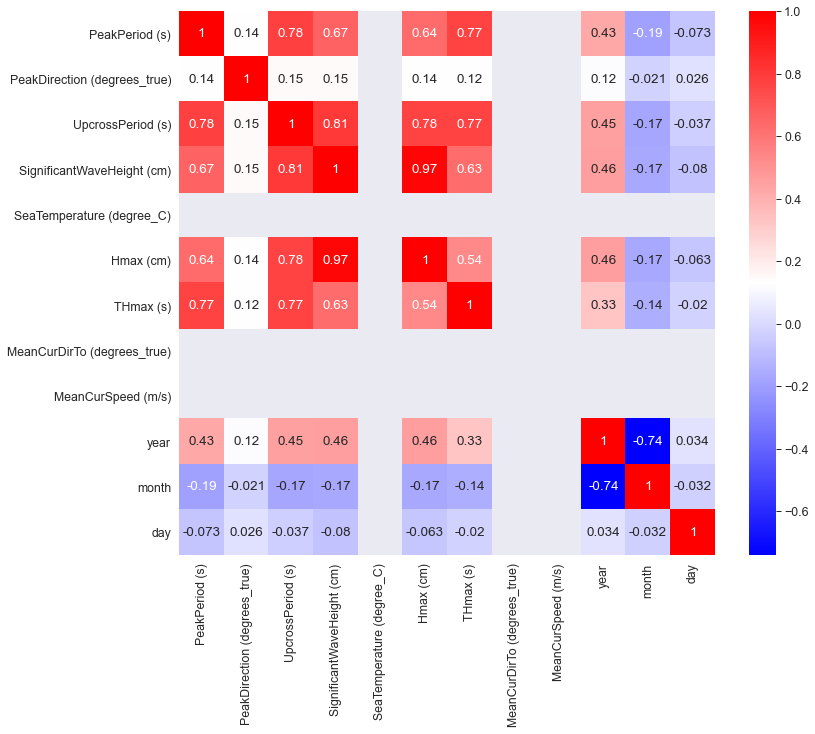

In [33]:
# Correlation of Wave Buoy variables
plt.figure(figsize=(12,10))
sns.set_context('paper', font_scale=1.4)
# To create a heatmap with data you must have data set up as a matrix where variables
# are on the columns and rows

wave_mx = wave_df.corr()

# Create the heatmap, add annotations and a color map
sns.heatmap(wave_mx, annot=True, cmap='bwr')

<AxesSubplot:xlabel='year', ylabel='month'>

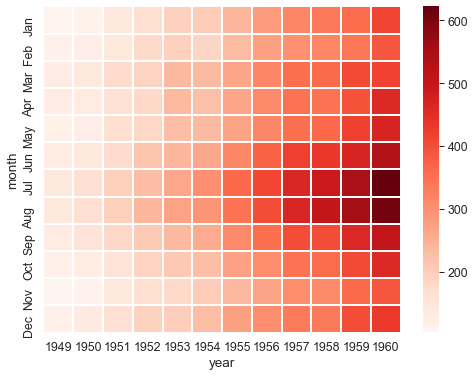

In [34]:
plt.figure(figsize=(8,6))
sns.set_context('paper', font_scale=1.4)

# We can create a matrix with an index of month, columns representing years
# and the number of passengers for each
# We see that flights have increased over time and that most people travel in
# July and August
flights = sns.load_dataset("flights")
flights = flights.pivot_table(index='month', columns='year', values='passengers')
# You can separate data with lines
sns.heatmap(flights, cmap='Reds', linecolor='white', linewidth=1)

[Text(0.5, 1.0, 'M2 Irish Sea Avg Sea Temperature')]

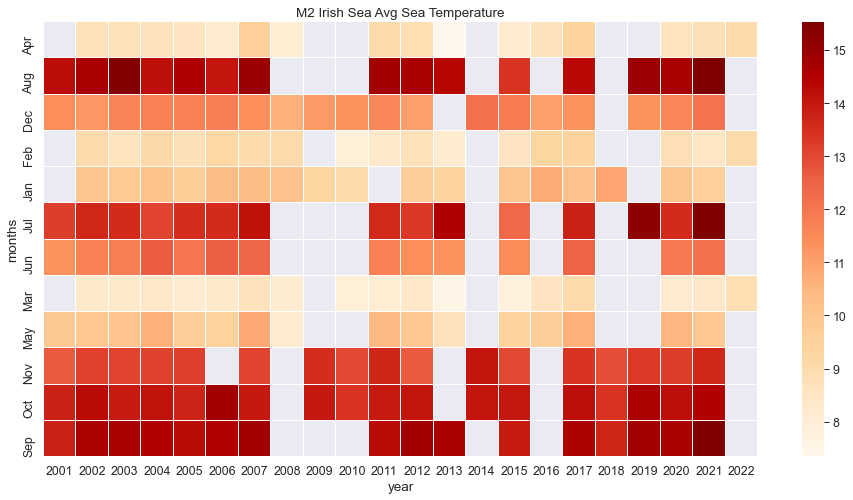

In [35]:
# Pivot Table showing temperature over the years by the months at a station
plt.figure(figsize=(16,8))
sns.set_context('paper', font_scale=1.4)

# We can create a matrix with an index of month, columns representing years
temperature_by_year = m2_df.pivot_table(index='months', columns='year', values='SeaTemperature (degrees_C)')
# You can separate data with lines
sns.heatmap(temperature_by_year, cmap='OrRd', linecolor='white', linewidth=0.01).set(title='M2 Irish Sea Avg Sea Temperature')

[Text(0.5, 1.0, 'Celtic Sea Wind Speed')]

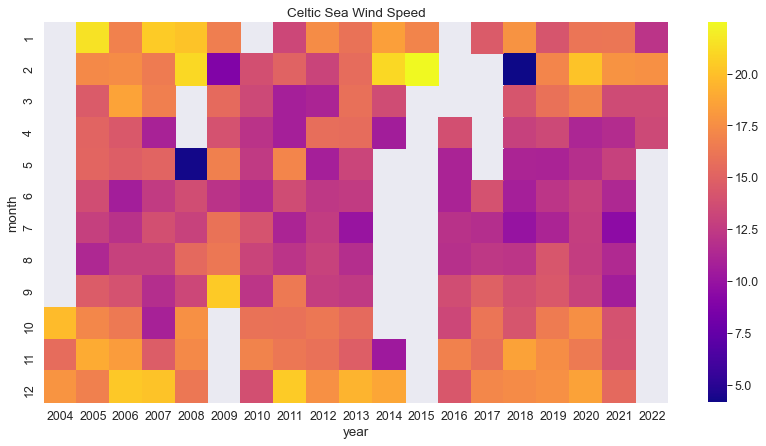

In [36]:
# Pivot Table showing wind speed over the years by the months at a station
plt.figure(figsize=(14,7))
sns.set_context('paper', font_scale=1.4)

# create a matrix with an index of month, columns representing years
wind_by_year = m5_df.pivot_table(index='month', columns='year', values='WindSpeed (knots)')
# separate data with lines
sns.heatmap(wind_by_year, cmap='plasma', linecolor='white', linewidth=0.0).set(title='Celtic Sea Wind Speed')

[Text(0.5, 1.0, 'Howth - Predicted Daily Tide Times')]

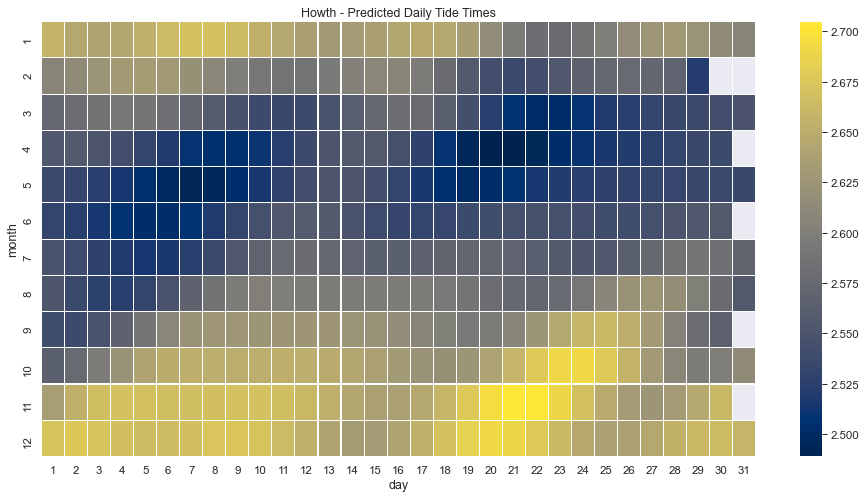

In [37]:
# Pivot Table showing temperature over the years by the months at a station
plt.figure(figsize=(16,8))
sns.set_context('paper', font_scale=1.3)

# create a matrix with an index of month, columns representing years
tides = tide_pred_df.pivot_table(index='month', columns='day', values='Water_Level (metres)')
# You can separate data with lines
sns.heatmap(tides, cmap='cividis', linewidth=0.1).set(title='Howth - Predicted Daily Tide Times')

### Cluster Map

<Figure size 576x432 with 0 Axes>

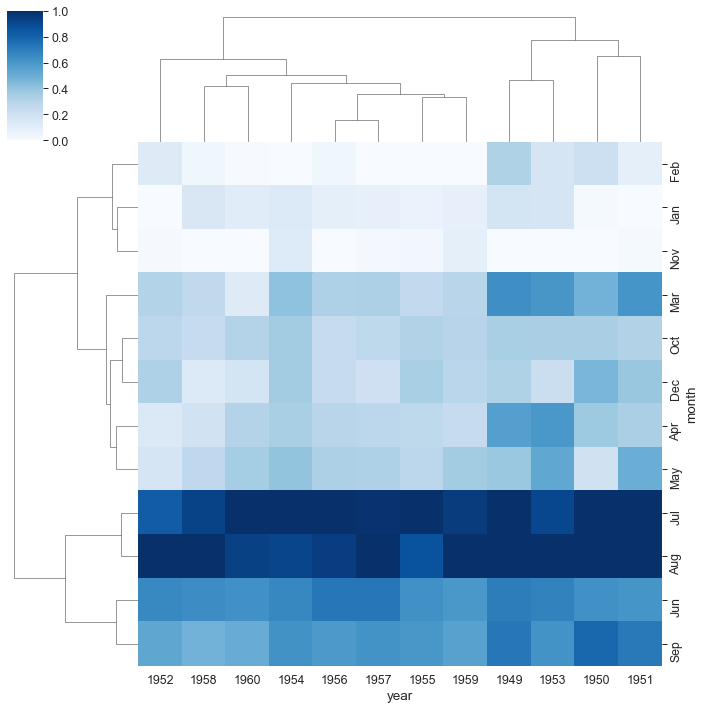

In [38]:
plt.figure(figsize=(8,6))
sns.set_context('paper', font_scale=1.4)

# A Cluster map is a hierarchically clustered heatmap
# The distance between points is calculated, the closest are joined, and this
# continues for the next closest (It compares columns / rows of the heatmap)
# This is data on iris flowers with data on petal lengths
iris = sns.load_dataset("iris")
# Return values for species
# species = iris.pop("species")
# sns.clustermap(iris)

# With our flights data we can see that years have been reoriented to place
# like data closer together
# You can see clusters of data for July & August for the years 59 & 60
# standard_scale normalizes the data to focus on the clustering
sns.clustermap(flights,cmap="Blues", standard_scale=1)


### PairGrid

<Figure size 576x432 with 0 Axes>

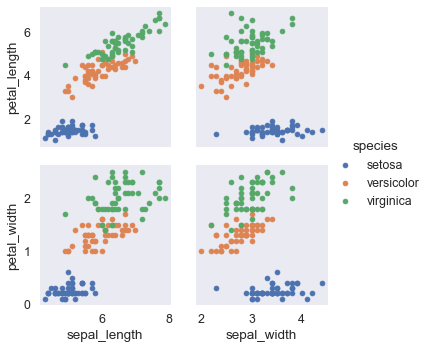

In [39]:
plt.figure(figsize=(8,6))
sns.set_context('paper', font_scale=1.4)

# You can create a grid of different plots with complete control over what is displayed
# Create the empty grid system using the provided data
# Colorize based on species
# iris_g = sns.PairGrid(iris, hue="species")

# Put a scatter plot across the upper, lower and diagonal
# iris_g.map(plt.scatter)

# Put a histogram on the diagonal 
# iris_g.map_diag(plt.hist)
# And a scatter plot every place else 
# iris_g.map_offdiag(plt.scatter)

# Have different plots in upper, lower and diagonal
# iris_g.map_upper(plt.scatter)
# iris_g.map_lower(sns.kdeplot)

# You can define define variables for x & y for a custom grid
iris_g = sns.PairGrid(iris, hue="species",
                      x_vars=["sepal_length", "sepal_width"],
                      y_vars=["petal_length", "petal_width"])

iris_g.map(plt.scatter)

# Add a legend last
iris_g.add_legend()

### Facet Grid

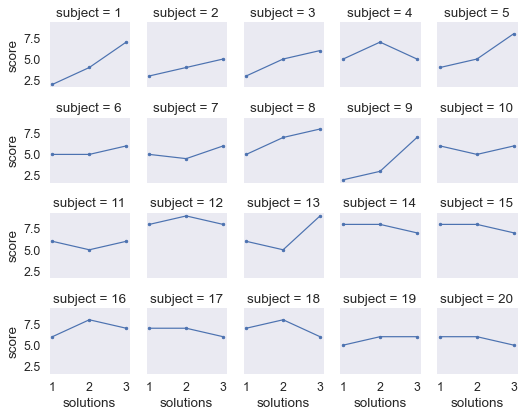

In [40]:
# Can also print multiple plots in a grid in which you define columns & rows
# Get histogram for smokers and non with total bill for lunch & dinner
# tips_fg = sns.FacetGrid(tips_df, col='time', row='smoker')

# You can pass in attributes for the histogram
# tips_fg.map(plt.hist, "total_bill", bins=8)

# Create a scatter plot with data on total bill & tip (You need to parameters)
# tips_fg.map(plt.scatter, "total_bill", "tip")

# We can assign variables to different colors and increase size of grid
# Aspect is 1.3 x the size of height
# You can change the order of the columns
# Define the palette used
# tips_fg = sns.FacetGrid(tips_df, col='time', hue='smoker', height=4, aspect=1.3,
#                       col_order=['Dinner', 'Lunch'], palette='Set1')
# tips_fg.map(plt.scatter, "total_bill", "tip", edgecolor='w')

# # Define size, linewidth and assign a color of white to markers
# kws = dict(s=50, linewidth=.5, edgecolor="w")
# # Define that we want to assign different markers to smokers and non
# tips_fg = sns.FacetGrid(tips_df, col='sex', hue='smoker', height=4, aspect=1.3,
#                         hue_order=['Yes','No'], 
#                         hue_kws=dict(marker=['^', 'v']))
# tips_fg.map(plt.scatter, "total_bill", "tip", **kws)
# tips_fg.add_legend()

# This dataframe provides scores for different students based on the level
# of attention they could provide during testing
att_df = sns.load_dataset("attention")
# Put each person in their own plot with 5 per line and plot their scores
att_fg = sns.FacetGrid(att_df, col='subject', col_wrap=5, height=1.5)
att_fg.map(plt.plot, 'solutions', 'score', marker='.')

### Regression Plots

In [41]:
# lmplot combines regression plots with facet grid
tips_df = sns.load_dataset('tips')
tips_df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


<Figure size 576x432 with 0 Axes>

<Figure size 576x432 with 0 Axes>

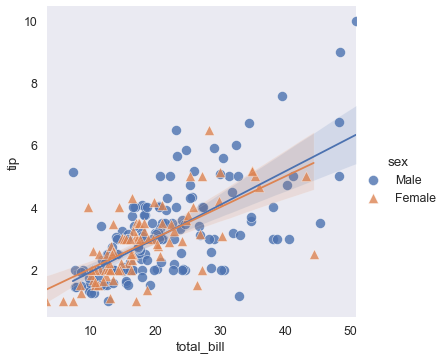

In [42]:
plt.figure(figsize=(8,6))
sns.set_context('paper', font_scale=1.4)

plt.figure(figsize=(8,6))

# We can plot a regression plot studying whether total bill effects the tip
# hue is used to show separation based off of categorical data
# We see that males tend to tip slightly more
# Define different markers for men and women
# You can effect the scatter plot by passing in a dictionary for styling of markers
sns.lmplot(x='total_bill', y='tip', hue='sex', data=tips_df, markers=['o', '^'], 
          scatter_kws={'s': 100, 'linewidth': 0.5, 'edgecolor': 'w'})

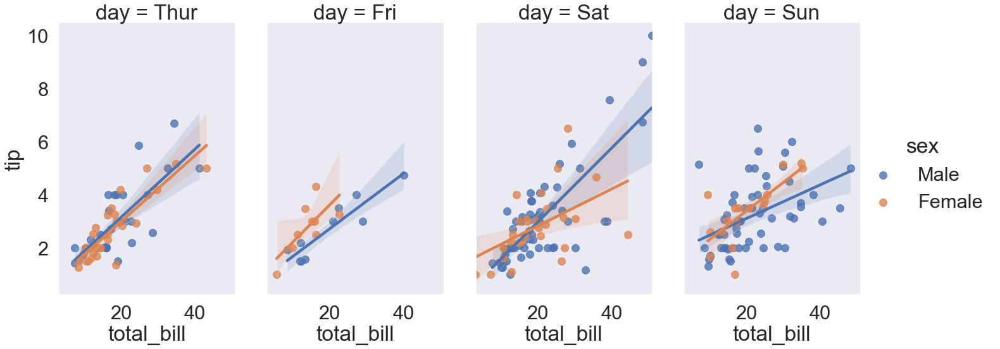

In [43]:
# You can separate the data into separate columns for day data
# sns.lmplot(x='total_bill', y='tip', col='sex', row='time', data=tips_df)
tips_df.head()

# Makes the fonts more readable
sns.set_context('poster', font_scale=1.4)

sns.lmplot(x='total_bill', y='tip', data=tips_df, col='day', hue='sex',
          height=8, aspect=0.6)

## Ridge Plots

In [ ]:
# csv = "..\data\ifba.csv"
# df = pd.read_csv(csv)
# Theme
sns.set_theme(style="dark", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
palette = sns.color_palette("Set2", 12)# create a grid with a row for each 'Language'
g = sns.FacetGrid(m2_df, palette=palette, row="year", hue="year", aspect=9, height=0.8) # map df - Kernel Density Plot of IMDB Score for each Language
g.map_dataframe(sns.kdeplot, x="WindSpeed (knots)", fill=True, alpha=1)
g.map_dataframe(sns.kdeplot, x="WindSpeed (knots)", color='black')# function to draw labels
def label(x, color, label):
    ax = plt.gca() #get current axis
    ax.text(0, .2, label, color='black', fontsize=13,
    ha="left", va="center", transform=ax.transAxes)
# iterate grid to plot labels
g.map(label, "year")# adjust subplots to create overlap
g.fig.subplots_adjust(hspace=-.5)# remove subplot titles
g.set_titles("")# remove yticks and set xlabel
g.set(yticks=[], xlabel="WindSpeed (knots)")
# remove left spine
g.despine(left=True)
# set title
plt.suptitle('M2 Windspeed', y=0.98)
plt.savefig('ridgeplot.png')

Text(0.5, 0.98, 'Significant Wave Height')

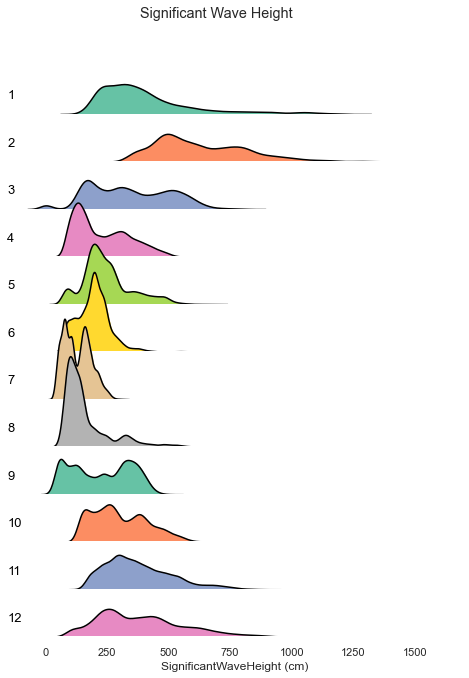

In [56]:
sns.set_theme(style="dark", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
palette = sns.color_palette("Set2", 12)# create a grid with a row for each 
g = sns.FacetGrid(wave_df, palette=palette, row="month", hue="month", aspect=9, height=0.8) 
# map df - Kernel Density Plot
g.map_dataframe(sns.kdeplot, x="SignificantWaveHeight (cm)", fill=True, alpha=1)
g.map_dataframe(sns.kdeplot, x="SignificantWaveHeight (cm)", color='black')# function to draw labels
def label(x, color, label):
    ax = plt.gca()
    #get current axis
    ax.text(0, .2, label, color='black', fontsize=13,
    ha="left", va="center", transform=ax.transAxes)
# iterate grid to plot labels
g.map(label, "month")# adjust subplots to create overlap
g.fig.subplots_adjust(hspace=-.5)# remove subplot titles
g.set_titles("")# remove yticks and set xlabel
g.set(yticks=[], xlabel="SignificantWaveHeight (cm)")
# remove left spine
g.despine(left=True)
# set title
plt.suptitle('Significant Wave Height', y=0.98)
# plt.savefig('ridgeplot.png')

C:\tools\Anaconda3\lib\site-packages\seaborn\axisgrid.py:64: UserWarning:

Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations

C:\tools\Anaconda3\lib\site-packages\seaborn\axisgrid.py:64: UserWarning:

Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations

C:\tools\Anaconda3\lib\site-packages\seaborn\axisgrid.py:64: UserWarning:

Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations



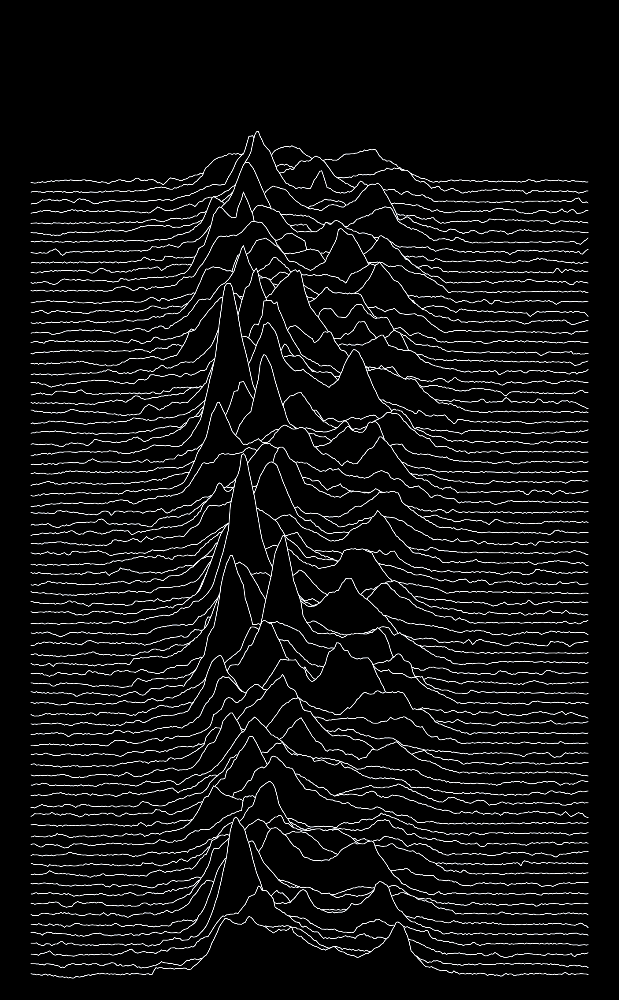

In [45]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
url = "https://gist.githubusercontent.com/borgar/31c1e476b8e92a11d7e9/raw/0fae97dab6830ecee185a63c1cee0008f6778ff6/pulsar.csv"
df = pd.read_csv(url, header=None)
df = df.stack().reset_index()
df.columns = ['idx', 'x', 'y']
sns.set_theme(rc={"axes.facecolor": (0, 0, 0, 0), 'figure.facecolor':'#000000', 'axes.grid':False})
g = sns.FacetGrid(df, row='idx', aspect=50, height=0.4)# Draw the densities in a few steps
g.map(sns.lineplot, 'x', 'y', clip_on=False, alpha=1, linewidth=1.5)
g.map(plt.fill_between, 'x', 'y', color='#000000')
g.map(sns.lineplot, 'x', 'y', clip_on=False, color='#ffffff', lw=2)# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-0.95)
g.set_titles("")
g.set(yticks=[], xticks=[], ylabel="", xlabel="")
g.despine(bottom=True, left=True)
plt.savefig('joy.png', facecolor='#000000')